# Download model

In [ ]:
# CLIP
!git clone https://github.com/openai/CLIP.git

#VQGAN Transformer
!git clone https://github.com/CompVis/taming-transformers

# Library

In [ ]:
! pip install -r requirements.txt

In [1]:
import numpy as np
import torch, os, imageio, pdb, math
import torchvision
import torchvision.transforms as T
import torchvision.transforms.functional as TF
import torch.nn.functional as F
import PIL
import matplotlib.pyplot as plt

import yaml
from omegaconf import OmegaConf

from CLIP import clip

# Load model CLIP

In [18]:
clipmodel, _ = clip.load('ViT-B/32', jit=False)
clipmodel.eval()
print(clip.available_models())

print("input_resolution: ", clipmodel.visual.input_resolution)

device=torch.device("cuda:0")
torch.cuda.empty_cache()

['RN50', 'RN101', 'RN50x4', 'RN50x16', 'RN50x64', 'ViT-B/32', 'ViT-B/16', 'ViT-L/14', 'ViT-L/14@336px']
input_resolution:  224


# Load model VQGAN

In [4]:
import os
import urllib.request

os.makedirs("models/vqgan_imagenet_f16_16384/checkpoints", exist_ok=True)
os.makedirs("models/vqgan_imagenet_f16_16384/configs", exist_ok=True)

ckpt_path = "models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt"
config_path = "models/vqgan_imagenet_f16_16384/configs/model.yaml"

if not os.path.exists(ckpt_path):
    print("Downloading checkpoint...")
    urllib.request.urlretrieve(
        "https://heibox.uni-heidelberg.de/f/867b05fc8c4841768640/?dl=1",
        ckpt_path
    )

if not os.path.exists(config_path):
    print("Downloading config...")
    urllib.request.urlretrieve(
        "https://heibox.uni-heidelberg.de/f/274fb24ed38341bfa753/?dl=1",
        config_path
    )


# Decoder (VQGAN Transformer)

File taming/data/utils

Fix: from torch._six import string_classes

-> string_classes=str

In [5]:
%cd taming-transformers/
from taming.models.vqgan import VQModel
from taming.models.vqgan import VQModel
import pytorch_lightning.callbacks.model_checkpoint as plc


# --- load config ---
def load_config(config_path, display=False):
    config_data = OmegaConf.load(config_path)
    if display:
        print(yaml.dump(OmegaConf.to_container(config_data)))
    return config_data

# --- load VQGAN patched ---
def load_vqgan(config, chk_path=None, device="cpu"):
    model = VQModel(**config.model.params).to(device)

    if chk_path is not None:
        # Load checkpoint full, allowing PyTorch Lightning objects
        with torch.serialization.safe_globals([plc.ModelCheckpoint]):
            checkpoint = torch.load(chk_path, map_location="cpu", weights_only=False)

        # Lấy state_dict
        if "state_dict" in checkpoint:
            state_dict = checkpoint["state_dict"]
        else:
            state_dict = checkpoint

        missing, unexpected = model.load_state_dict(state_dict, strict=False)
        if missing or unexpected:
            print("=== Warning: keys mismatch when loading checkpoint ===")
            print(f"Missing keys: {missing}")
            print(f"Unexpected keys: {unexpected}")

    return model.eval()

# --- generator ---
def generator(x):
    x = taming_model.post_quant_conv(x) #z_q
    x = taming_model.decoder(x) #Generator sinh ảnh
    return x

# --- Load config and model ---
device = "cuda" if torch.cuda.is_available() else "cpu"

taming_config = load_config(
    "./models/vqgan_imagenet_f16_16384/configs/model.yaml",
    display=True
)

taming_model = load_vqgan(
    taming_config,
    chk_path="./models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt",
    device=device
)

[Errno 2] No such file or directory: 'taming-transformers/'
/content/taming-transformers
model:
  base_learning_rate: 4.5e-06
  params:
    ddconfig:
      attn_resolutions:
      - 16
      ch: 128
      ch_mult:
      - 1
      - 1
      - 2
      - 2
      - 4
      double_z: false
      dropout: 0.0
      in_channels: 3
      num_res_blocks: 2
      out_ch: 3
      resolution: 256
      z_channels: 256
    embed_dim: 256
    lossconfig:
      params:
        codebook_weight: 1.0
        disc_conditional: false
        disc_in_channels: 3
        disc_num_layers: 2
        disc_start: 0
        disc_weight: 0.75
      target: taming.modules.losses.vqperceptual.VQLPIPSWithDiscriminator
    monitor: val/rec_loss
    n_embed: 16384
  target: taming.models.vqgan.VQModel

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:05<00:00, 93.3MB/s]


8.19kB [00:00, 13.5MB/s]                   

loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.


### Show image after decoding

In [6]:

def show_from_tensor(tensor):
    """
    Show a tensor PyTorch (C x H x W) -> Image.

    Args:
        tensor (torch.Tensor): Tensor value [0,1] or [-1,1].
    """
    img = tensor.clone().detach()

    # [-1,1] -> [0,1]
    if img.min() < 0:
        img = (img.clip(-1, 1) + 1) / 2

    img = img.mul(255).byte()  # 0-255
    img = img.cpu().numpy().transpose((1, 2, 0))  # C x H x W -> H x W x C

    plt.figure(figsize=(10, 7))
    plt.axis('off')
    plt.imshow(img)
    plt.show()


def norm_data(data):
    """
    Normalizing data in [-1,1] to [0,1].

    Args:
        data (np.ndarray or torch.Tensor): Input data.

    Returns:
        np.ndarray or torch.Tensor: Normalized data.
    """
    return (data.clip(-1, 1) + 1) / 2



# Latent Space

In [8]:
import torch
import torch.nn as nn

class Parameters(nn.Module):
    """
    Module including latent value.
    """
    def __init__(self, batch_size, latent_channels, height, width, device="cuda"):
        super().__init__()
        '''
        batch_size: batch size
        latent_channels: latent channels (ex: 256) in  latent space
        height, width: size of latent map (original size // 16)
        device: "cuda" or "cpu"

        '''
        # initiate latent tensor random with small std
        init_tensor = 0.5 * torch.randn(batch_size, latent_channels, height, width, device=device)
        # Apply sin to transform parameter -> support gradient
        self.data = nn.Parameter(torch.sin(init_tensor)) #[-1, 1]

    def forward(self):
        return self.data

def init_params(batch_size, latent_channels, height, width, learning_rate=0.05, wd=0.0, device="cuda"):
    """
    Args:
        initiate object Parameters and optimizer AdamW -> Optimize latent tensor.
        batch_size: batch size
        latent_channels: latent channels (ex: 256)
        height, width: original size
        learning_rate: tep update latent
        wd: weight decay (regularization to avoid overfitting latent)
        device: "cuda" or "cpu"

    returns:
        latent tensor, optimizer
    """
    # latent map (1/16 of original size)
    w, h = width // 16, height // 16

    # initiate Parameters
    params = Parameters(batch_size, latent_channels, h, w, device=device).to(device)

    # initiate optimizer for params.data
    optimizer = torch.optim.AdamW(params.parameters(), lr=learning_rate, weight_decay=wd)


    return params, optimizer


In [9]:
# --- example ---
batch_size = 1
latent_channels = 256
width, height = 272, 400
learning_rate = 0.005
wd = 0.01
device = "cuda" if torch.cuda.is_available() else "cpu"

params, optimizer = init_params(batch_size, latent_channels, width, height, learning_rate, wd, device)
latent = params()  #  latent tensor
print(latent.shape)  # torch.Size [batch size, latent channels, size1 // 16, size2 // 16]

torch.Size([1, 256, 17, 25])


In [10]:
print(272/16)
print(400/16)

17.0
25.0


# CLIP


### Text Encoder

In [11]:
# -------------------------
# Text encoding functions
# -------------------------
def encode_text(text: str, clip_model) -> torch.Tensor:
    """
    Tokenize and encode a text prompt using CLIP.

    Args:
        text (str): The text prompt.
        clip_model: Preloaded CLIP model.

    Returns:
        torch.Tensor: Encoded text tensor on CUDA.
    """
    tokens = clip.tokenize(text).cuda()
    embedding = clip_model.encode_text(tokens).detach().clone()
    return embedding


def create_encodings(include: list, exclude: str, extras: str, clip_model):
    """
    Encode include, exclude, and extras text prompts.

    Args:
        include (list): List of strings to include.
        exclude (str): Single string to exclude.
        extras (str): Single string for extra emphasis.
        clip_model: Preloaded CLIP model.

    Returns:
        Tuple[List[torch.Tensor], torch.Tensor or int, torch.Tensor or int]:
        Encoded include list, exclude, extras.
    """
    include_enc = [encode_text(text, clip_model) for text in include]
    exclude_enc = encode_text(exclude, clip_model) if exclude != '' else 0
    extras_enc = encode_text(extras, clip_model) if extras != '' else 0
    return include_enc, exclude_enc, extras_enc




# Generate image

Latent shape: torch.Size([1, 256, 17, 25])
Image dimensions: torch.Size([1, 3, 272, 400])


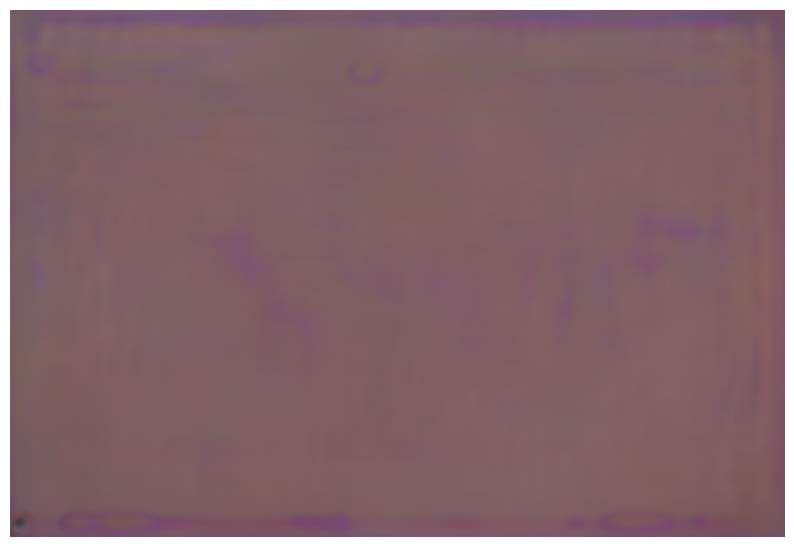

In [12]:
batch_size = 1
latent_channels = 256
H, W = 272, 400
learning_rate = 0.05
wd = 0.01
device = "cuda" if torch.cuda.is_available() else "cpu"


# -------------------------
# Initialize latent parameters
# -------------------------
params, optimizer = init_params(batch_size, latent_channels=256, width=W, height=H,
                                learning_rate=learning_rate, wd=wd, device=device)

# -------------------------
# Test generator output
# -------------------------
with torch.no_grad():
    latent = params()  # latent tensor
    print("Latent shape:", latent.shape) #[batch size, 256, w//16, H//16]

    img = norm_data(generator(latent).cpu())  # [1 x 3 x H x W]
    print("Image dimensions:", img.shape)

    # Show first image in batch
    show_from_tensor(img[0])

# Augmentation & Crop

In [13]:
# Image augmentation
aug_transform = nn.Sequential(
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomAffine(15, translate=(0.15, 0.15), fill=0)
).cuda()


# Create crop
def create_crops(img: torch.Tensor, num_crops: int = 32, crop_size: int = 224, noise_factor: float = 0.22) -> torch.Tensor:
    """
    Create many random crops from image, apply augmentation and add noise.

    Args:
        img (torch.Tensor): image input, size [1 x 3 x H x W].
        num_crops (int): number of crops need created.
        crop_size (int): final size of each crop (after interpolate).
        noise_factor (float): noise random factor.

    Returns:
        torch.Tensor: Tensor including all crops, size [num_crops x 3 x crop_size x crop_size].
    """
    # --- Padding image to create  margin ---
    height = img.shape[2]
    pad = height // 2
    img_padded = F.pad(img, (pad, pad, pad, pad), mode='constant', value=0)  # [1 x 3 x H+pad*2 x W+pad*2]

    # --- Apply augmentation (Horrizon & Affine) ---
    img_aug = aug_transform(img_padded)

    crop_set = []
    for _ in range(num_crops):
        # Random crop size with Gaussian noise and clamp
        gap = int(torch.normal(1.5, 0.5, ()).clip(0.45, 1.5) * height)
        offset_x = torch.randint(0, int(height*2 - gap), ())
        offset_y = torch.randint(0, int(height*2 - gap), ())

        # Crop
        crop = img_aug[:, :, offset_x:offset_x+gap, offset_y:offset_y+gap]

        # Resize -> standard size
        crop_resized = F.interpolate(crop, (crop_size, crop_size), mode='bilinear', align_corners=True)
        crop_set.append(crop_resized)

    # --- Concate all crops ---
    img_crops = torch.cat(crop_set, dim=0)  # [num_crops x 3 x crop_size x crop_size]

    # --- Add random noise ---
    rand_normal = torch.randn_like(img_crops, requires_grad=False)
    rand_scale = torch.rand((img_crops.shape[0], 1, 1, 1), device=img_crops.device)
    img_crops = img_crops + noise_factor * rand_scale * rand_normal

    return img_crops

### Show crop

In [14]:
def showme(params, show_crop: bool = True) -> torch.Tensor:
    """
    Show  current status current of generation from latent params.
    Include:
        - Original image (generation)
        - Augmented crop image if show_crop=True

    Args:
        params (nn.Module): Object Parameters including latent tensor.
        show_crop (bool): if True, show a crop augmented.

    Returns:
        torch.Tensor: Final generation (normalized, tensor 3 x H x W)
    """
    with torch.no_grad():
        # --- Generate from  latent ---
        generated = generator(params())  # [1 x 3 x H x W]

        # --- Show crop if needed ---
        if show_crop:
            print("Augmented cropped example:")
            aug_gen = generated.float()
            # Create only crop
            aug_crop = create_crops(aug_gen, num_crops=1)
            aug_crop_norm = norm_data(aug_crop[0])
            show_from_tensor(aug_crop_norm)

        # --- Show full generation ---
        print("Generation:")
        latest_gen = norm_data(generated.cpu()[0])
        show_from_tensor(latest_gen)

    return latest_gen


# Loss

In [ ]:
import torch
import torchvision.transforms as T

clip_normalize = T.Normalize(
    mean=[0.48145466, 0.4578275, 0.40821073],
    std=[0.26862954, 0.26130258, 0.27577711]
)


def Loss(params: torch.nn.Module,
                    prompt_enc: torch.Tensor,
                    exclude_enc: torch.Tensor = None,
                    extras_enc: torch.Tensor = None,
                    include_weight: float = 1.0, exclude_weight: float = 0.5) -> torch.Tensor:
    """
    Calculate loss to optimize latent tensor based prompt text và CLIP embeddings.

    Args:
        params (nn.Module): Object Parameters including latent tensor.
        prompt_enc (torch.Tensor): Encoded prompt text, shape [1 x 512].
        extras_enc (torch.Tensor, optional): Additional encoded prompts to encourage.
        exclude_enc (torch.Tensor, optional): Encoded prompts to discourage.
        include_weight (float): alpha (include).
        exclude_weight (float): beta (exclude).

    Returns:
        torch.Tensor: Loss tensor for each crop, shape [num_crops].
    """
    # --- Generate image from latent ---
    out = generator(params())          # [1 x 3 x H x W]
    out = norm_data(out)               # normalize to [0,1]
    out_crops = create_crops(out)      # [num_crops x 3 x 224 x 224]
    out_crops = clip_normalize(out_crops)   # CLIP normalization

    # --- Encode image crops --- embedding image
    image_enc = clipmodel.encode_image(out_crops)  # [num_crops x 512]

    # --- Text embeddings ---
    # final include text embedding (prompt + extras)

    final_include_enc = (prompt_enc + extras_enc)  if extras_enc is not None else extras_enc  # [1 x 512]
    final_include_enc = final_include_enc / final_include_enc.norm(dim=-1, keepdim=True)

    final_exclude_enc = exclude_enc  if exclude_enc is not None else '' # [1 x 512] or 0

    # --- Compute cosine similarity ---
    main_loss = torch.cosine_similarity(final_include_enc, image_enc, dim=-1)  # Max
    penalty_loss = torch.cosine_similarity(final_exclude_enc, image_enc, dim=-1) if isinstance(final_exclude_enc, torch.Tensor) else 0.0  #Min

    # --- Final loss ---
    final_loss = -include_weight * main_loss + exclude_weight * penalty_loss

    return final_loss


def optimize(params: torch.nn.Module, optimizer: torch.optim.Optimizer, prompt_enc: torch.Tensor,
             exclude_enc: None, extras_enc: None) -> torch.Tensor:
    """
    A step to optimize latent tensor by gradient descent.

    Args:
        params (nn.Module): Object Parameters including latent tensor.
        optimizer (torch.optim.Optimizer): Optimizer to updaye params.data.
        prompt_enc (torch.Tensor): Encoded prompt text.

    Returns:
        torch.Tensor: average loss value of batch.
    """
    loss = Loss(params, prompt_enc, exclude_enc, extras_enc).mean()
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    return loss


# Training

In [16]:
import torch

def training_loop(include_enc: list,
                  exclude_enc: None,
                  extras_enc: None,
                  init_params_fn,
                  total_iter: int = 100,
                  show_step: int = 20,
                  show_crop: bool = False):
    """
    Training loop to optimize latent tensor Params based list of encoded prompts.

    Args:
        include_enc (list of torch.Tensor): List of prompt embeddings.
        init_params_fn (callable): init_params() to create Params and optimizer.
        total_iter (int): max iteration for each prompt.
        show_step (int): Show image after step.
        show_crop (bool): if True, show crop augmented.

    Returns:
        Tuple[List[torch.Tensor], List[torch.Tensor]]:
            res_img: list of image tensor (normalized) saved in show_step
            res_z: list of latent Params, respectively
    """
    res_img = []
    res_z = []

    for prompt_idx, prompt in enumerate(include_enc):
        print(f"Optimizing prompt {prompt_idx+1}/{len(include_enc)}")

        # Initiate latent Params and optimizer for each prompt
        Params, optimizer = init_params_fn()

        for iteration in range(1, total_iter + 1):
            loss = optimize(Params, optimizer, prompt, exclude_enc, extras_enc)

            # Show and save status of show_step after show_step
            if iteration >= 60 and iteration % show_step == 0:
                new_img = showme(Params, show_crop)
                res_img.append(new_img)
                res_z.append(Params())  # lưu latent tensor
                print(f"Iteration {iteration}, Loss: {loss.item():.4f}")

        # Clear GPU memory after each prompt
        torch.cuda.empty_cache()

    return res_img, res_z


Optimizing prompt 1/1
Augmented cropped example:


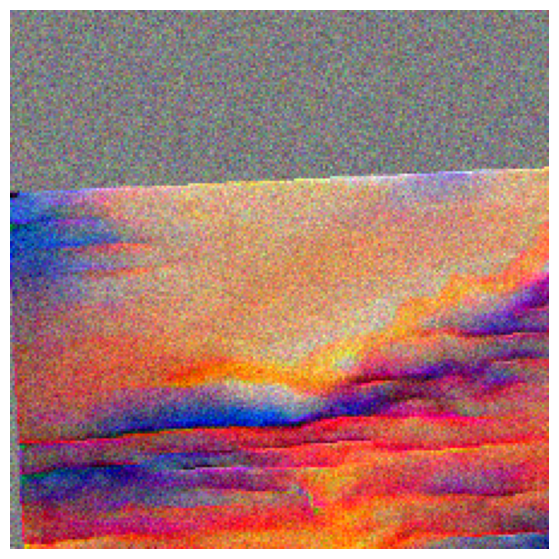

Generation:


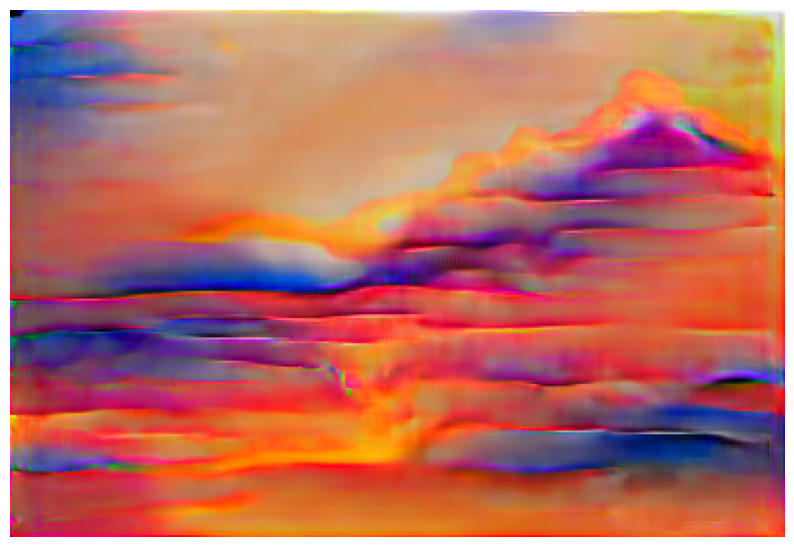

Iteration 60, Loss: -0.3245
Augmented cropped example:


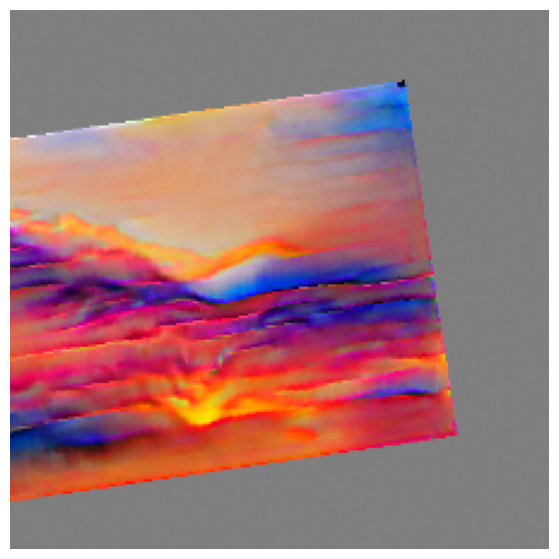

Generation:


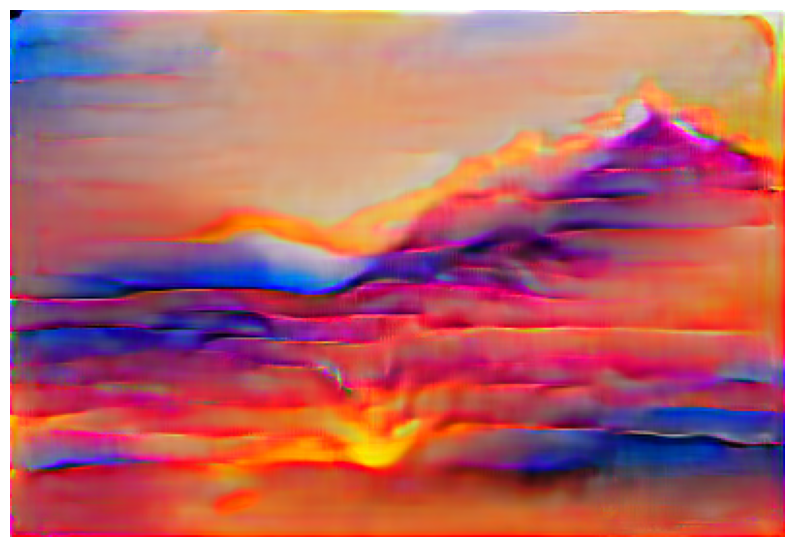

Iteration 90, Loss: -0.3225
Augmented cropped example:


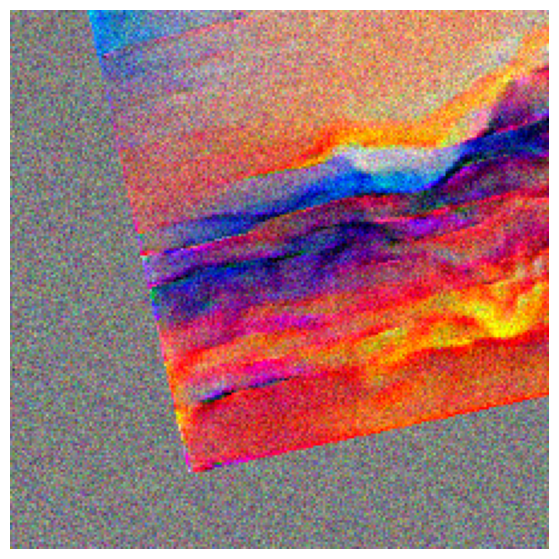

Generation:


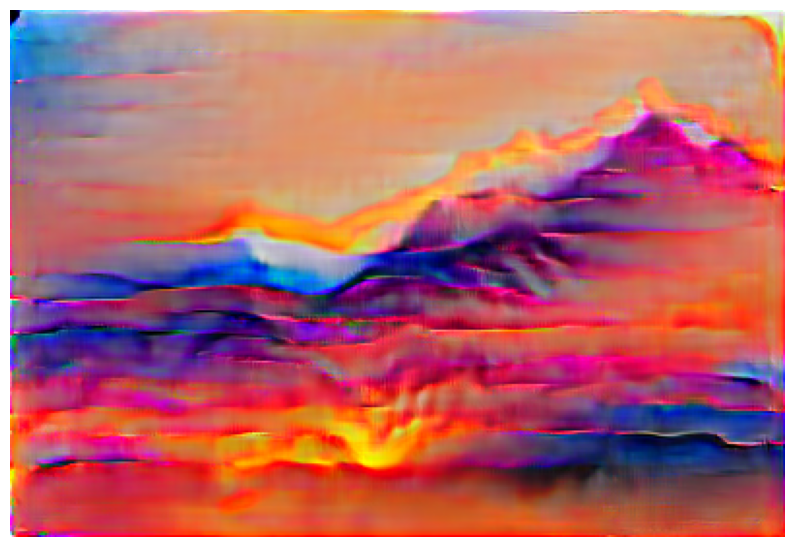

Iteration 120, Loss: -0.3416
Augmented cropped example:


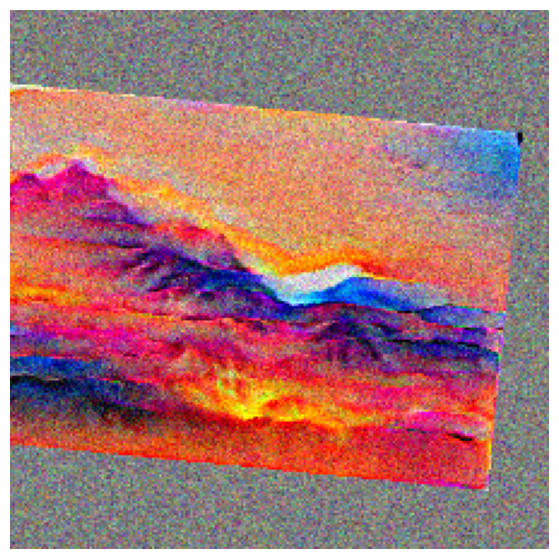

Generation:


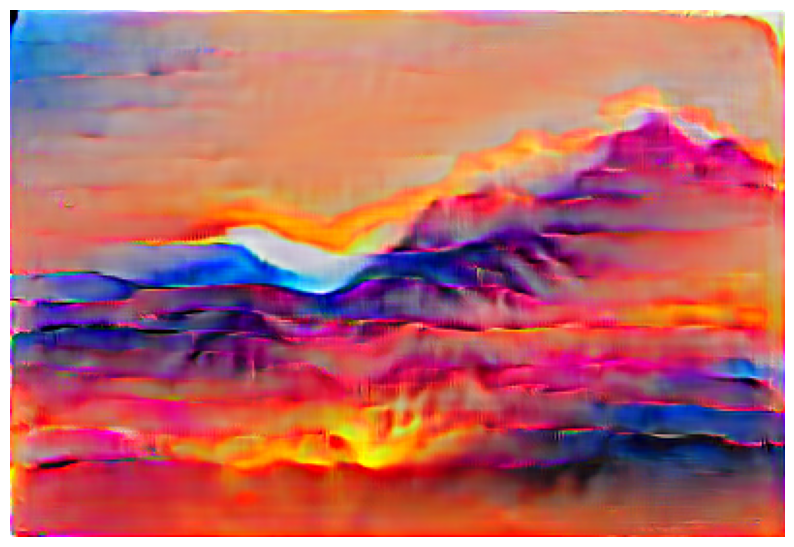

Iteration 150, Loss: -0.3489


In [ ]:
# --- Clear GPU memory ---
torch.cuda.empty_cache()

# --- Text prompts ---
include = ['A colorful sunset over mountains']
exclude = 'watermark'
extras = ''

w1 = 0.8            # factor for include prompt
w2 = 0.5            # factor for exclude prompt
noise_factor = 0.15 # add noise to crops
total_iter = 150
show_step = 30
H, W = 272, 400

# --- Encode prompts ---
include_enc, exclude_enc, extras_enc = create_encodings(include, exclude, extras, clip_model=clipmodel)

# --- Run training loop ---
res_img, res_z = training_loop(
    include_enc=include_enc,
    exclude_enc=exclude_enc,
    extras_enc=extras_enc,
    init_params_fn=lambda: init_params(
        batch_size=batch_size,
        latent_channels=256,
        height=H,
        width=W,
        learning_rate=learning_rate,
        wd=wd,
        device=device
    ),
    total_iter=total_iter,
    show_step=show_step,
    show_crop=True
)

In [20]:
print(len(res_img), len(res_z))
print(res_img[0].shape, res_z[0].shape)

4 4
torch.Size([3, 272, 400]) torch.Size([1, 256, 17, 25])


# Inference


=== Optimizing prompt 1/1 ===
Generation:


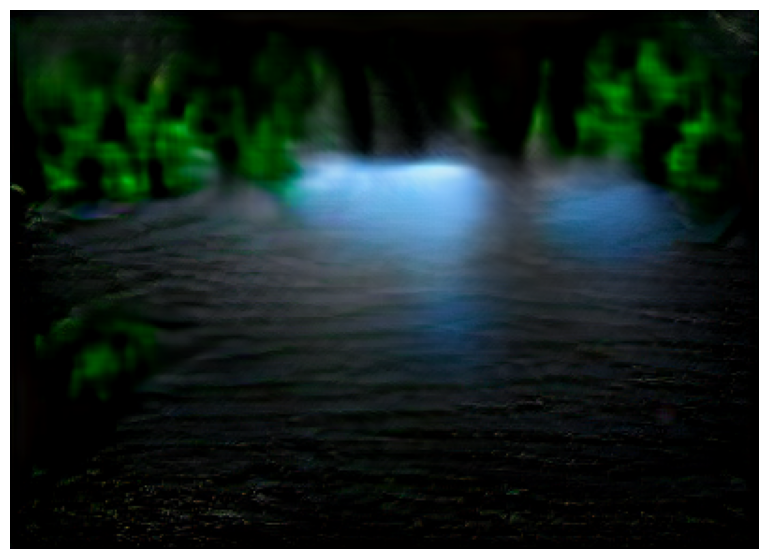

Iteration 60, Loss: -0.1610
Generation:


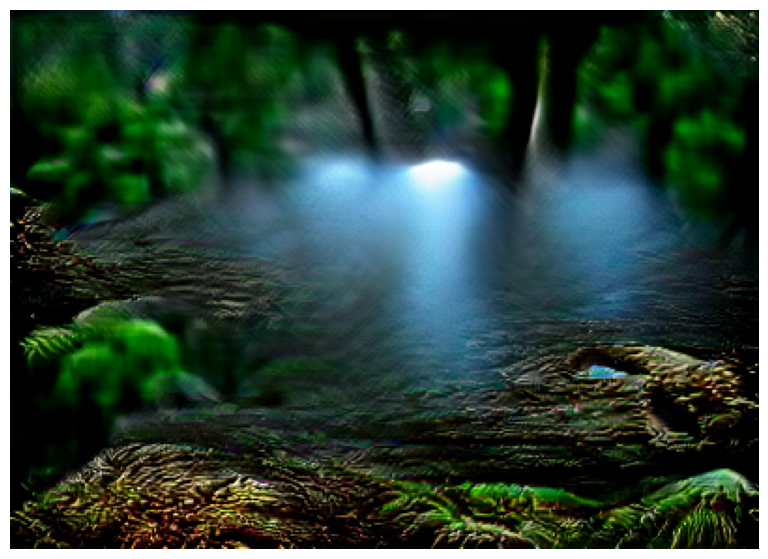

Iteration 90, Loss: -0.1794
Generation:


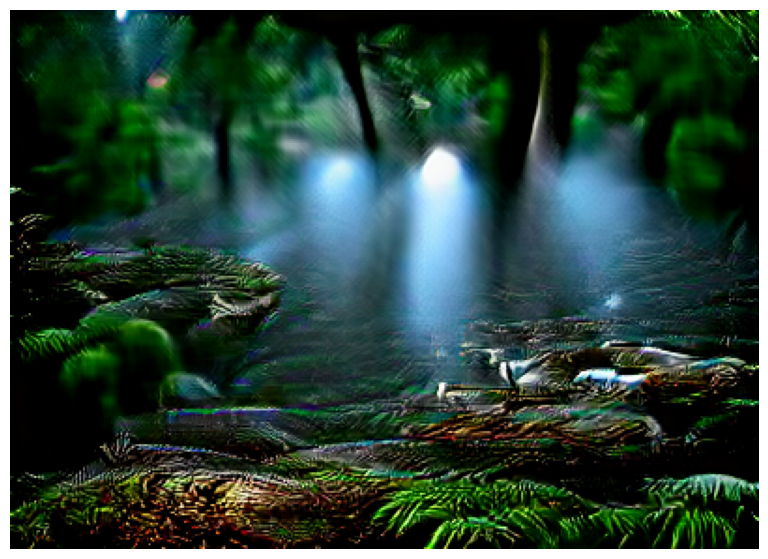

Iteration 120, Loss: -0.1979
Generation:


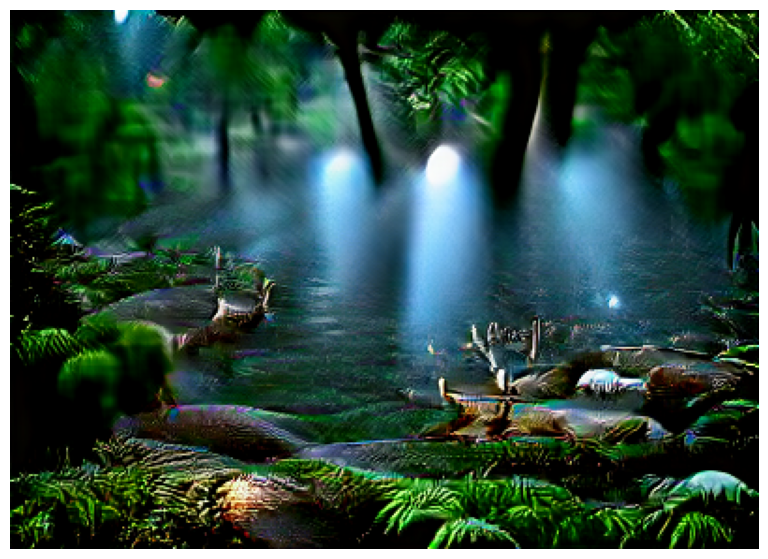

Iteration 150, Loss: -0.2102


In [ ]:
torch.cuda.empty_cache()

include = [
    "A magical forest with a flowing river, deer drinking water, colorful birds flying, glowing mushrooms on the ground, soft sunlight streaming through trees, mist rising from the river"
]
exclude = "watermark, blurry, unnatural colors"
extras = "high detail, cinematic lighting, photorealistic"


w1 = 1
w2 = 1
noise_factor = 0.15
total_iter = 150
show_step = 30
H, W = 288, 400
# --- Encode prompts ---
include_enc, exclude_enc, extras_enc = create_encodings(include, exclude, extras, clip_model=clipmodel)

# --- Run training loop ---
res_img1, res_z1 = training_loop(
    include_enc=include_enc,
    exclude_enc=exclude_enc,
    extras_enc=extras_enc,
    init_params_fn=lambda: init_params(
        batch_size=batch_size,
        latent_channels=256,
        height=H,
        width=W,
        learning_rate=learning_rate,
        wd=wd,
        device=device
    ),
    total_iter=total_iter,
    show_step=show_step,
    show_crop=False
)


# Interpolation

In [ ]:
import math
from torchvision import transforms as T
from typing import List
from PIL import Image

def interpolate(res_z_list: list, duration_list: list, fps: int = 25) -> List[Image.Image]:
    """
    Interpolate betwwen latent tensors (res_z_list) and generate intermediate image.

    Args:
        res_z_list (list of torch.Tensor): List of latent tensor, shape [1 x C x H x W].
        duration_list (list of float): time (second) for for each transition.
        fps (int): Frame per second to calculate the number of interpolation.

    Returns:
        List[PIL.Image.Image]: List of interpolated images (PIL Images).
    """
    gen_img_list = []
    to_pil = T.ToPILImage(mode='RGB')

    num_latents = len(res_z_list)
    for idx, (z1, duration) in enumerate(zip(res_z_list, duration_list)):
        num_steps = int(duration * fps)
        indices = torch.randperm(len(res_z_list))[:2]  # chọn 2 latent ngẫu nhiên
        z2 = 0.5 * res_z_list[indices[0]] + 0.5 * res_z_list[indices[1]]

        for step in range(num_steps):
            # alpha interpolation (smooth sinusoidal)
            alpha = math.sin(step / num_steps * math.pi)
            z_new = alpha * z2 + (1 - alpha) * z1

            # Generate image from latent
            new_gen = norm_data(generator(z_new).cpu())[0]  # [3 x H x W]
            new_img = to_pil(new_gen)
            gen_img_list.append(new_img)

    return gen_img_list


# Create Video

In [ ]:
import imageio
import numpy as np
from PIL import Image
from typing import List

def create_video_from_images(img_list: List[Image.Image], out_path: str, fps: int = 25):
    """
    Create video from list PIL Images and save to file mp4.

    Args:
        img_list (List[PIL.Image.Image]): List PIL image.
        out_path (str): path to save video (mp4).
        fps (int): Frame per second.
    """
    writer = imageio.get_writer(out_path, fps=fps)

    for pil_img in img_list:
        # convert PIL Image to numpy array (uint8)
        frame = np.array(pil_img, dtype=np.uint8)
        writer.append_data(frame)

    writer.close()
    print(f"Video saved to {out_path}")


In [ ]:
from IPython.display import HTML, display
from base64 import b64encode
from pathlib import Path

def display_video(video_path: str, width: int = 600):
    """
    Show video MP4.

    Args:
        video_path (str): Path to file video (.mp4).
        width (int): width of showned video.
    """
    video_file = Path(video_path)
    if not video_file.is_file():
        raise FileNotFoundError(f"Video file not found: {video_path}")

    with open(video_path, "rb") as f:
        mp4_bytes = f.read()

    data_url = "data:video/mp4;base64," + b64encode(mp4_bytes).decode()
    display(HTML(f"""<video width={width} controls>
                        <source src="{data_url}" type="video/mp4">
                     </video>"""))



In [ ]:
print(len(res_z1))
print(len(res_z))

4
4


In [ ]:
duration_list = [3,2,3,2,3,2] #75,50,75,50,75,50
fps = 25
res_z_all = res_z1 + res_z
frames = interpolate(res_z_all, duration_list, fps=fps)


In [ ]:
create_video_from_images(frames,"../video_VQGAN_CLIP.mp4" )

display_video("../video_VQGAN_CLIP.mp4", width=500)

Video saved to ../video_VQGAN_CLIP.mp4
